In [9]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
#di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
#di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)
%matplotlib inline
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
import tensorflow as tf
import matplotlib.gridspec as gridspec
import os
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import scipy as sp
import matplotlib as mpl
import matplotlib.cm as cm
import pandas as pd
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 200)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")
from scipy import stats
from scipy.stats import norm, gamma
from scipy.stats import distributions
from scipy.special import gammaln
import scipy
import random
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import linear_model
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from __future__ import division
import plotly.plotly as py
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn import linear_model
#Take care of warnings
import warnings
warnings.filterwarnings("ignore")
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()


<h2 align="center">Predicting the State-Level Population Health Outcomes and Hospitals Quality Based on Demographic Datasets</h2> 
<h3 align="center">Yuting Sun</h3> 
## Motivation

For years, we have relied on population surveys to keep track of regional public health statistics, including the prevalence of non-communicable diseases. Socio-demographic factors, as key determinants of health and wellbeing in a population, are often used for examining their potential impact on the population health outcomes. However, because of the cost and limitations of such surveys, we often do not have the up-to-date data on health outcomes of a region. In this paper, we examined the feasibility of inferring regional health outcomes from socio-demographic data that are widely available and timely updated through national censuses and community surveys. 

There are a number of ways that the proposed machine learning models may contribute to addressing challenges in public health. In order to provide higher predictive utility than traditional approaches, it is important to expand the role of socio-demographic data from contributing to explanations of patterns of health, to predicting their distribution in communities. On the other hand, since our demographics datasets are not very large which only cover the information from 2007 to 2012, it is a big challenge to be feasible or cost-effective to produce survey-based estimate based on such a small set of population-level characteristics.

Apart from predicting the disease prevalence, we also hope to investigate the relationship between state-level hopital quality and socio-demographic statistics. Intuitively speaking, hopital quality and health care level in one area should be linked with local economy development, population and so on. Through our collected hopital quality score in one state and its corresponding demographic features, we can train our model and predict the health quality based on the incoming time series socio-demographic data.


## Objective

This project is divided into two parts, we hope to predict the population health outcomes and local hospitals quality based on socio-demographic statistics. For the prediction of population health outcome, we will predict the prevalence of non-communicable diseases and risk factors at the state level in the United States. By comparing our prediction and the actual outcome, we hope to validate that there exists evidence that disease prevalence is related to socio-demographic statistics. On the other hand, hospital qualities including mortality, safety, readmission, patient experience, effectiveness of care, timeliness of care and efficient use of medical imaging are also deserved to be investigated since national healthcare develpment is highly affected by local demographic parameters. Besides, although population health outcomes and local hospitals quality are both related to human health, they may affected by different demographic factors (congenital or external characteristics). Therefore, it is important for us to analyze the influence from various demographic characteristics on population health outcomes and local hospitals quality.

## Dataset Discription
Two datasets were used in this project.
Firstly, according to the Official US Government Medicare Quality Rating Standard, a hospital summary score is calculated by taking the weighted average of the hospital’s scores for each measure group of total seven categories, including mortality, safety, readmission, patient experience, effectiveness of care, timeliness of care and efficient use of medical imaging. The second dataset contains 23 demographic characteristics of 50 US states collected from 2007 to 2012, including household income, age, race, education and so on. We evaluate the non-communicable disease prevalence using the statistics of serverl common disease such as diabetes, heart attack, angina or coronary, obese and stroke.

![](Screen Shot 2017-04-10 at 15.39.37.png)

## Part I - Analysis on  Population Health Outcome Based on Socio-Demographic Characteristics

In [2]:

df_socio = pd.read_csv("pone.0125602.s002 (1)/Diabetes.csv")
df_att = pd.read_csv("pone.0125602.s002 (1)/Heart attack.csv")
df_aoc = pd.read_csv("pone.0125602.s002 (1)/Angina or coronary.csv")
df_obe = pd.read_csv("pone.0125602.s002 (1)/Obese.csv")
df_str = pd.read_csv("pone.0125602.s002 (1)/Stroke.csv")
df_socio.insert(3, 'Heart attack', df_att['Heart attack'])
df_socio.insert(4, 'Angina or coronary', df_aoc['Angina or coronary'])
df_socio.insert(5, 'Obese', df_obe['Obese'])
df_socio.insert(6, 'Stroke', df_str['Stroke'])
diseases_mean = np.mean(df_socio[['Diabetes','Heart attack','Angina or coronary','Obese','Stroke']].values,axis = 1)
df_socio.insert(7, 'disease_mean', diseases_mean)
df_socio.head()

,state,year,Diabetes,Heart attack,Angina or coronary,Obese,Stroke,disease_mean,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races
0,AL,2007,10.3,4.9,5.2,30.9,3.6,10.98,12.7,13.7,14.4,11.4,13.5,19.494115,32.204432,28.466480,6.7,48.365753,13.6,11.9,14.9,41.3,11.8,27.1,2.4,7.5,0.447076,0.962888,26.191811,0.032801,0.749570,1.300128
1,AK,2007,6.1,2.3,2.5,28.2,1.9,8.20,13.9,14.2,16.1,10.7,6.9,22.729358,32.075809,34.604619,8.8,52.273811,7.9,8.0,12.6,62.6,11.5,32.5,2.0,3.3,13.469051,4.818882,3.777883,0.728334,2.272348,6.864888
2,AZ,2007,8.4,4.6,4.9,25.8,2.9,9.32,14.5,13.6,12.9,10.3,12.9,22.914359,27.624823,32.112133,5.8,50.061755,11.0,11.8,15.5,49.8,12.4,30.6,1.9,5.9,4.434562,2.388703,3.549451,0.121491,10.683297,2.435415
3,AR,2007,9.2,5.1,5.5,29.3,3.1,10.44,12.9,13.4,14.0,11.3,14.0,17.707376,35.750906,27.739906,7.2,48.935956,14.3,13.0,16.1,37.7,11.8,24.6,2.4,7.6,0.614682,1.197017,15.601787,0.080217,2.252578,1.702838
4,CA,2007,7.6,3.1,3.0,23.3,2.3,7.86,14.3,14.9,14.0,9.7,10.9,26.477150,24.526672,29.436311,6.6,50.014063,9.7,9.3,13.0,57.5,9.5,34.6,2.5,5.3,0.727846,12.342025,6.191967,0.345647,16.679592,3.453557


![](Screen Shot 2017-04-19 at 23.48.39.png)

This dataset lists 23 demographic characteristics of 50 US states collected from 2007 to 2012. It helps us to explore the relationship between the socio-demographic characteristics and US Population Health Outcomes, especially for state-level prevalence of several common diseases, like diabetes, heart attacks, angina and the socio-demographic information, like education levels, gender proportion, house-hold income and so on. Divergence of observed from predicted values may provide a method for ranking states’ performance in promoting population health that takes account of the full and extensive effect of demographic characteristics.


<font color = "blue">

## Please run this cell to show the animation map

In [8]:

df_group=df_socio[:50].groupby('state')['disease_mean'].mean()
df_group=pd.DataFrame(df_group)
df_group=df_group.reset_index()

#Map syntax
df_socio['text'] = df_group['state']

data = [dict(
    type='choropleth',
   # autocolorscale = False,
    locations = df_group['state'],
    z = df_group['disease_mean'].astype(float),
    locationmode = 'USA-states',
    text = df_socio['text'],
    hoverinfo = 'location+z',
    marker = dict(
        line = dict (
            color = 'rgb(255,255,255)',
            width = 2
        )
    ),
    colorbar = dict(
        title = "Rating"
    )
)]
layout = dict(
    title = 'Common Diseases Prevalence by State',
    geo = dict(
        scope='usa',
        projection=dict( type='albers usa' ),
        showlakes = True,
        lakecolor = 'rgb(255,255,255)'
    )
)    
fig = dict(data=data, layout=layout)

import plotly.graph_objs as go

iplot(fig, validate=False, filename='d3-Ratings-map')

### Intuition as seen from the dataset

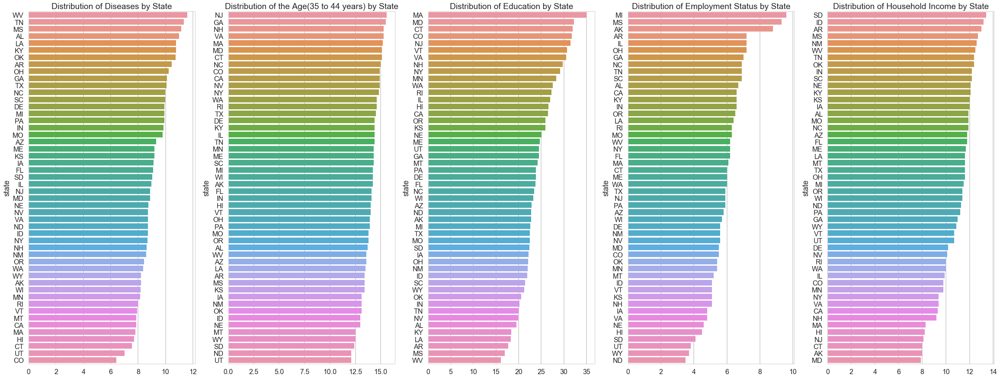

In [25]:
plt.figure(figsize=(40,15))

plt.subplot(151)
Statewise_disea = df_socio[:50].groupby('state')['disease_mean'].mean()
index_disea = Statewise_disea.sort_values(ascending=False).index
values_disea= Statewise_disea.sort_values(ascending=False).values
ax=sns.barplot(y=index_disea,x=values_disea)
plt.title('Distribution of Diseases by State')

plt.subplot(152)
Statewise_age = df_socio[:50].groupby('state')['Age - 35 to 44 years'].mean()
index_age = Statewise_age.sort_values(ascending=False).index
values_age= Statewise_age.sort_values(ascending=False).values
ax=sns.barplot(y=index_age,x=values_age)
plt.title('Distribution of the Age(35 to 44 years) by State')

plt.subplot(153)
Statewise_educa = df_socio[:50].groupby('state')['Education - Bachelor degree or higher'].mean()
index_educa = Statewise_educa.sort_values(ascending=False).index
values_age= Statewise_educa.sort_values(ascending=False).values
ax=sns.barplot(y=index_educa,x=values_age)
plt.title('Distribution of Education by State')

plt.subplot(154)
Statewise_emp = df_socio[:50].groupby('state')['Employment status - Unemployed'].mean()
index_emp = Statewise_emp.sort_values(ascending=False).index
values_emp= Statewise_emp.sort_values(ascending=False).values
ax=sns.barplot(y=index_emp,x=values_emp)
plt.title('Distribution of Employment Status by State')

plt.subplot(155)
Statewise_income = df_socio[:50].groupby('state')['Household income - 25000 to 34999'].mean()
index_income = Statewise_income.sort_values(ascending=False).index
values_income= Statewise_income.sort_values(ascending=False).values
ax=sns.barplot(y=index_income,x=values_income)
plt.title('Distribution of Household Income by State')
plt.show()

As can be found from the plots above, the first barplot is our observation outcomes about disease prevelence. Taking MA as an example, it ranks at the least in disease prevalence while its education and household income rank at the top, which may indicate that states which have higher level of household income and eduation will have a postive effect on reducing disease prevelence. Normally, we hope to obtain detailed information as much as possible before formally doing data analysis in order to know better about our data and build more reasonable models.

## Methodology

## 1. Linear Regression

<h5 align="center"> Y = c + βX </h5>

Due to the large number of variables involved, in order to avoid overfit, the regression model was fitted using least square with ridge and lasso penalization on the regression coefficients β. Lasso has a control parameter that decides the number of variables being selected for a given health index, and this was determined by 10-fold cross-validation. Ridge regression attempts to reduce the norm of the estimated vector and at the same time tries to keep the sum of squared errors small. Unlike Lasso, ridge regression will not let certain parameters disappear, instead, it will adjust the weight of each variables to make sure that the highly related variables will have a relatively larger weight than others. We will compare the performance of these two linear models in the following part.

### 1.1 Linear regression - Ridge

Ridge regression attempts to reduce the norm of the estimated vector and at the same time tries to keep the sum of squared errors small. in order to achieve this combined goal, the vector components, θi, are modified in such a way so that the contribution in the misfit measuring term, from the less informative directions in the input space, is minimized.

In [26]:
df_socio.head()

,state,year,Diabetes,Heart attack,Angina or coronary,Obese,Stroke,disease_mean,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races,text
0,AL,2007,10.3,4.9,5.2,30.9,3.6,10.98,12.7,13.7,14.4,11.4,13.5,19.494115,32.204432,28.466480,6.7,48.365753,13.6,11.9,14.9,41.3,11.8,27.1,2.4,7.5,0.447076,0.962888,26.191811,0.032801,0.749570,1.300128,AK
1,AK,2007,6.1,2.3,2.5,28.2,1.9,8.20,13.9,14.2,16.1,10.7,6.9,22.729358,32.075809,34.604619,8.8,52.273811,7.9,8.0,12.6,62.6,11.5,32.5,2.0,3.3,13.469051,4.818882,3.777883,0.728334,2.272348,6.864888,AL
2,AZ,2007,8.4,4.6,4.9,25.8,2.9,9.32,14.5,13.6,12.9,10.3,12.9,22.914359,27.624823,32.112133,5.8,50.061755,11.0,11.8,15.5,49.8,12.4,30.6,1.9,5.9,4.434562,2.388703,3.549451,0.121491,10.683297,2.435415,AR
3,AR,2007,9.2,5.1,5.5,29.3,3.1,10.44,12.9,13.4,14.0,11.3,14.0,17.707376,35.750906,27.739906,7.2,48.935956,14.3,13.0,16.1,37.7,11.8,24.6,2.4,7.6,0.614682,1.197017,15.601787,0.080217,2.252578,1.702838,AZ
4,CA,2007,7.6,3.1,3.0,23.3,2.3,7.86,14.3,14.9,14.0,9.7,10.9,26.477150,24.526672,29.436311,6.6,50.014063,9.7,9.3,13.0,57.5,9.5,34.6,2.5,5.3,0.727846,12.342025,6.191967,0.345647,16.679592,3.453557,CA


Prediction accuracy rate for train set: 0.9590807779782528
Prediction accuracy rate for test set: 0.9610567100916156


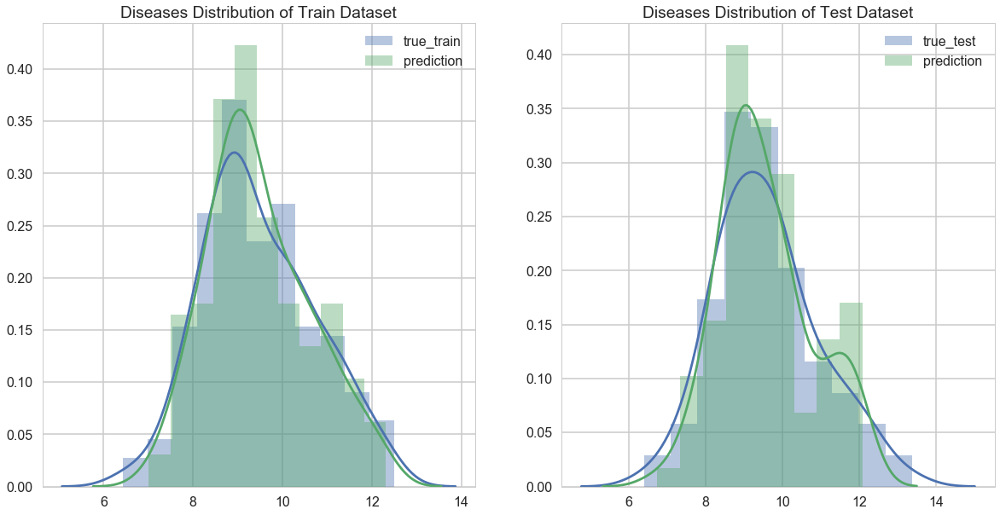

In [42]:
Y_disease = df_socio.values[:,7]
X_disease = df_socio.values[:,8:32]
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
X_disease_train, X_disease_test, Y_disease_train, Y_disease_test = train_test_split(X_disease,
                                                    Y_disease, test_size=.33,
                                                    random_state=1234)

plt.figure(figsize=(20,10))

plt.subplot(121)
clf_ridge = Ridge()
# fit and predict
clf_ridge.fit(X_disease_train, Y_disease_train)
predictions_train = clf_ridge.predict(X_disease_train)
sns.distplot(Y_disease_train,label = 'true_train')
sns.distplot(predictions_train,label = 'prediction')
plt.title('Diseases Distribution of Train Dataset')
plt.legend()
print ('Prediction accuracy rate for train set:',(1 - np.mean(abs(Y_disease_train-predictions_train))/np.mean(Y_disease_train)))
train_accur_ridge = 1 - np.mean(abs(Y_disease_train-predictions_train))/np.mean(Y_disease_train)
plt.subplot(122)


predictions_test = clf_ridge.predict(X_disease_test)
sns.distplot(Y_disease_test,label = 'true_test')
sns.distplot(predictions_test,label = 'prediction')
plt.title('Diseases Distribution of Test Dataset')
plt.legend()
test_accur_ridge = 1 - np.mean(abs(Y_disease_test-predictions_test))/np.mean(Y_disease_test)
print ('Prediction accuracy rate for test set:',(1 - np.mean(abs(Y_disease_test-predictions_test))/np.mean(Y_disease_test)))

### 1.2 Linear regression - Lasso

Prediction accuracy rate for train set: 0.9580455129689462
Prediction accuracy rate for test set: 0.9603102723147565


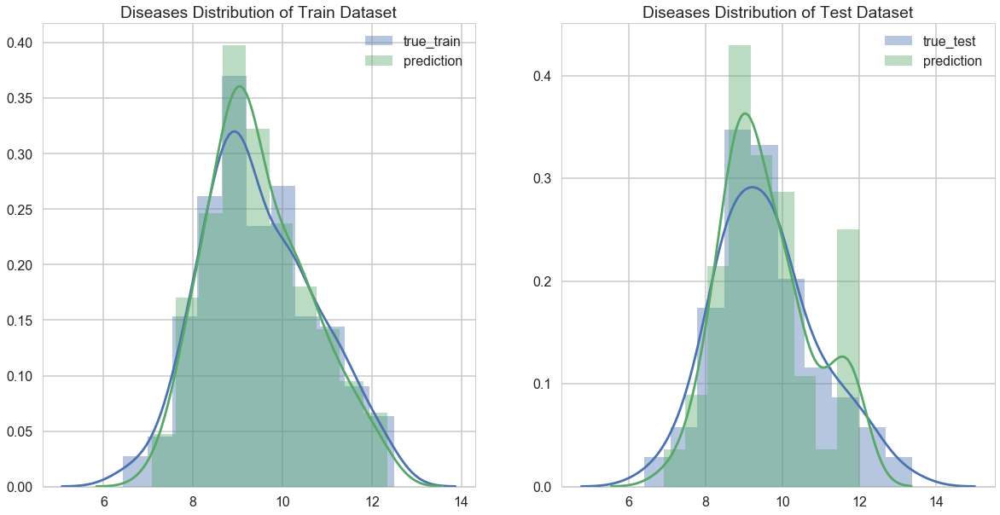

In [94]:
clf_lasso = linear_model.Lasso(alpha=0.01)
clf_lasso.fit(X_disease_train, Y_disease_train)
predictions_train = clf_lasso.predict(X_disease_train)
plt.figure(figsize=(20,10))

plt.subplot(121)
sns.distplot(Y_disease_train,label = 'true_train')
sns.distplot(predictions_train,label = 'prediction')
plt.title('Diseases Distribution of Train Dataset')
plt.legend()
train_accur_lasso = 1 - np.mean(abs(Y_disease_train-predictions_train))/np.mean(Y_disease_train)
print ('Prediction accuracy rate for train set:',(1 - np.mean(abs(Y_disease_train-predictions_train))/np.mean(Y_disease_train)))

plt.subplot(122)
predictions_test = clf_lasso.predict(X_disease_test)
sns.distplot(Y_disease_test,label = 'true_test')
sns.distplot(predictions_test,label = 'prediction')
plt.title('Diseases Distribution of Test Dataset')
plt.legend()
test_accur_lasso = 1 - np.mean(abs(Y_disease_test-predictions_test))/np.mean(Y_disease_test)
print ('Prediction accuracy rate for test set:',(1 - np.mean(abs(Y_disease_test-predictions_test))/np.mean(Y_disease_test)))

In [95]:
compare_arr = np.array([train_accur_ridge,train_accur_lasso,test_accur_ridge,test_accur_lasso]).reshape(2,2)
names = ['Ridge Linear Regression','Lasso Linear Regression']
df_compare = pd.DataFrame(data=compare_arr, columns=names,index = ['Train Accuracy Rate','Test Accuracy Rate'])
df_compare

,Ridge Linear Regression,Lasso Linear Regression
Train Accuracy Rate,0.959081,0.958046
Test Accuracy Rate,0.961057,0.960310


### Look at the coefficients for each parameter

In [96]:
print ('Coefficients with Ridge')
clf_ridge.coef_

Coefficients with Ridge


array([-0.03908714, -0.1819732 , -0.25711129,  0.21363501, -0.02464004,
       -0.1889474 , -0.02784641, -0.06194937,  0.02505541, -0.38030704,
       -0.13406931,  0.02745323, -0.18437798, -0.04393201,  0.03086318,
       -0.0570137 , -0.13124311,  0.10300037, -0.01487559,  0.08938794,
        0.03178783, -0.72632461, -0.08063557,  0.12004299])

In [97]:
print ('Coefficients with Lasso')
clf_lasso.coef_

Coefficients with Lasso


array([-0.        , -0.1417211 , -0.16896807,  0.14012775,  0.04141439,
       -0.16872017, -0.0005772 , -0.03633245,  0.02318613, -0.33666023,
       -0.        ,  0.        , -0.18046429, -0.02013885,  0.02365631,
       -0.05155777, -0.        ,  0.        , -0.01250647,  0.06374474,
        0.03312996, -0.54200677, -0.06862167,  0.08669262])

In [98]:
connect = np.concatenate((clf_ridge.coef_.reshape(1,24),clf_lasso.coef_.reshape(1,24)),axis = 0)
df_coef = pd.DataFrame(data=connect, columns=list(df_socio)[8:32],index = ['Ridge','Lasso'])
df_coef


,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races
Ridge,-0.039087,-0.181973,-0.257111,0.213635,-0.024640,-0.188947,-0.027846,-0.061949,0.025055,-0.380307,-0.134069,0.027453,-0.184378,-0.043932,0.030863,-0.057014,-0.131243,0.103,-0.014876,0.089388,0.031788,-0.726325,-0.080636,0.120043
Lasso,-0.000000,-0.141721,-0.168968,0.140128,0.041414,-0.168720,-0.000577,-0.036332,0.023186,-0.336660,-0.000000,0.000000,-0.180464,-0.020139,0.023656,-0.051558,-0.000000,0.000,-0.012506,0.063745,0.033130,-0.542007,-0.068622,0.086693


As shown in the table, age,gender,race have a main impact on common diseases prevalence. To be more specific, taking gender-effect as an example, the coefficient of gender-male is about -0.4 (both using ridge and lasso), which means gender-male has a negative effect on these serverl disease prevalence. In other words, if the proportion of male to female for one state becomes greater, then disease prevalence in this state will be lower.

On the other hand, household income, marital status, education have relatively small influence on predicting disease prevalence. The results make sense because the disease is highly dependent on congenital factors, such as age, gender and races. External factors like income and education may contribute a little bit to the prevalence but not the fundamental elements. Therefore, we can basically obtain the conclusion that depending on race, age, gender distribution for one state, serveral common disease prevalence can be predicted with a high accuracy rate.


In [592]:

df_socio1 = pd.read_csv("pone.0125602.s002 (1)/Diabetes.csv")
df_att = pd.read_csv("pone.0125602.s002 (1)/Heart attack.csv")
df_aoc = pd.read_csv("pone.0125602.s002 (1)/Angina or coronary.csv")
df_obe = pd.read_csv("pone.0125602.s002 (1)/Obese.csv")
df_str = pd.read_csv("pone.0125602.s002 (1)/Stroke.csv")
df_socio1.insert(3, 'Heart attack', df_att['Heart attack'])
df_socio1.insert(4, 'Angina or coronary', df_aoc['Angina or coronary'])
df_socio1.insert(5, 'Obese', df_obe['Obese'])
df_socio1.insert(6, 'Stroke', df_str['Stroke'])
diseases_mean = np.mean(df_socio[['Diabetes','Heart attack','Angina or coronary','Obese','Stroke']].values,axis = 1)
df_socio1.insert(7, 'disease_mean', diseases_mean)
disease_mean = np.mean(df_socio1['disease_mean'].values)
df_socio1['disease_mean'][df_socio1['disease_mean']< disease_mean] = 0
#df_socio['disease_mean'][df_socio['disease_mean']> disease_mean]

In [593]:
df_socio1['disease_mean'][df_socio1['disease_mean']>= disease_mean] = 1
df_socio1.head()


,state,year,Diabetes,Heart attack,Angina or coronary,Obese,Stroke,disease_mean,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races
0,AL,2007,10.3,4.9,5.2,30.9,3.6,1.0,12.7,13.7,14.4,11.4,13.5,19.494115,32.204432,28.466480,6.7,48.365753,13.6,11.9,14.9,41.3,11.8,27.1,2.4,7.5,0.447076,0.962888,26.191811,0.032801,0.749570,1.300128
1,AK,2007,6.1,2.3,2.5,28.2,1.9,0.0,13.9,14.2,16.1,10.7,6.9,22.729358,32.075809,34.604619,8.8,52.273811,7.9,8.0,12.6,62.6,11.5,32.5,2.0,3.3,13.469051,4.818882,3.777883,0.728334,2.272348,6.864888
2,AZ,2007,8.4,4.6,4.9,25.8,2.9,0.0,14.5,13.6,12.9,10.3,12.9,22.914359,27.624823,32.112133,5.8,50.061755,11.0,11.8,15.5,49.8,12.4,30.6,1.9,5.9,4.434562,2.388703,3.549451,0.121491,10.683297,2.435415
3,AR,2007,9.2,5.1,5.5,29.3,3.1,1.0,12.9,13.4,14.0,11.3,14.0,17.707376,35.750906,27.739906,7.2,48.935956,14.3,13.0,16.1,37.7,11.8,24.6,2.4,7.6,0.614682,1.197017,15.601787,0.080217,2.252578,1.702838
4,CA,2007,7.6,3.1,3.0,23.3,2.3,0.0,14.3,14.9,14.0,9.7,10.9,26.477150,24.526672,29.436311,6.6,50.014063,9.7,9.3,13.0,57.5,9.5,34.6,2.5,5.3,0.727846,12.342025,6.191967,0.345647,16.679592,3.453557


## Next step
In order to ensure the results were robust against the choice of learning methods and avoid the prediction error due to the limited data size of the socio-demographic dataset, a number of other general machine learning methods were also applied for comparison, such as kmeans, logistic regression, random forest, mixture gaussian model.

## Transform Continuous Obsevative Outcome into Discrete Number
For make our outcome more robust, we convert our continuous desease level into binary number. 1 means the disease prevalence level is higher than or equal to the average level, and 0 represents the lower level of prevalence compared with the average. We will compare the performance using different prediction models in the following part.


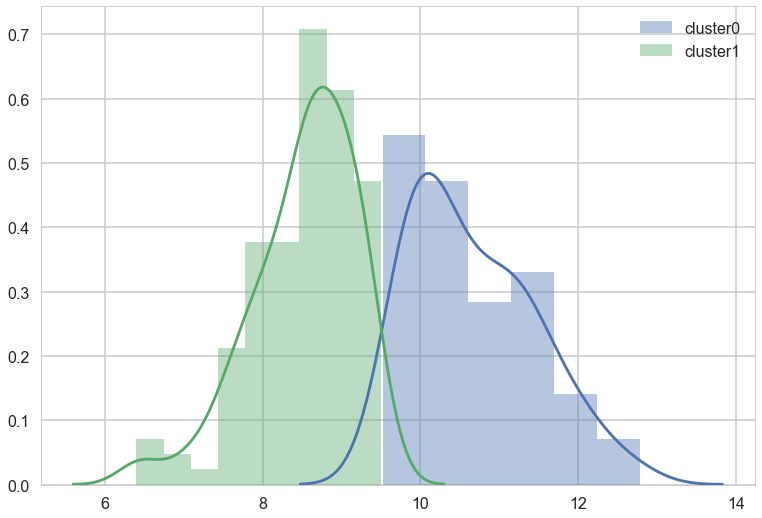

In [594]:

sns.distplot(train_0_true,label = 'cluster0' )
sns.distplot(train_1_true,label = 'cluster1' )

plt.legend()
plt.show()

## 2. Logistic Regression



Logistic regression is a GLM (Generalized Linear Model) used to model a binary categorical variable which is our project outcome variable Y using numerical and categorical predictors. Assume a binomial distribution produced the outcome variable and we therefore want to model probability of success(Y = 1) for a given set of predictors

Sigmoid Model for binomial logistic regression:
<h3 align="center"> $ln(\frac { p }{ 1-p } )=\beta _{ 0 }+\beta _{ 1 }X_{ 1 }+...+\beta _{ n }X_{ n } $</h3>



In [595]:
X_disease_train, X_disease_test, Y_disease_train, Y_disease_test = train_test_split(X_disease,
                                                    Y_disease, test_size=.33,
                                                    random_state=1230)


from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

clf_logistic = linear_model.LogisticRegression(max_iter=10000)
# fit and predict
clf_logistic.fit(X_disease_train,list(Y_disease_train) )


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=10000, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [306]:
predictions_logistic_train = clf_logistic.predict(X_disease_train)
scores = cross_val_score(LogisticRegression(), X_disease_train, list(Y_disease_train), cv= 5, scoring='accuracy')
scores

array([ 0.95121951,  0.92682927,  0.875     ,  0.95      ,  0.82051282])

Prediction accuracy rat using logistic regression for train set: 0.940298507463
Prediction accuracy rat using logistic regression for test set: 0.858585858586


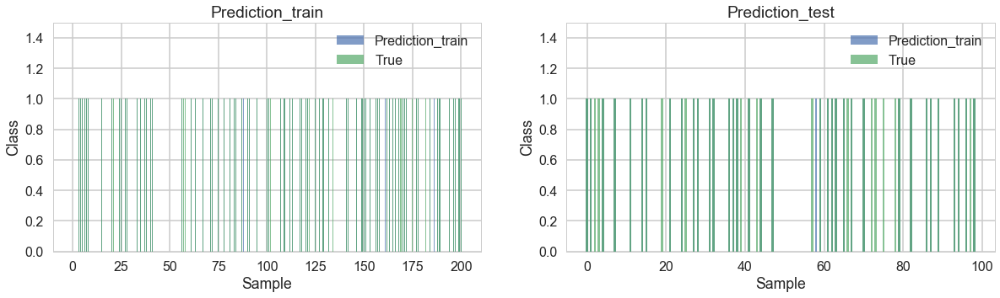

In [315]:

plt.figure(figsize=(20,5))
plt.subplot(121)
print ('Prediction accuracy rat using logistic regression for train set:',np.mean(Y_disease_train == predictions_logistic_train))
n = np.arange(len(predictions_logistic_train))
plt.bar(n,predictions_logistic_train,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_train,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_train')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)

plt.subplot(122)
predictions_logistic_test = clf_logistic.predict(X_disease_test)
print ('Prediction accuracy rat using logistic regression for test set:',np.mean(Y_disease_test == predictions_logistic_test))
n = np.arange(len(predictions_logistic_test))
plt.bar(n,predictions_logistic_test,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_test,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_test')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)
plt.show()
plt.show()

### 3. Random Forest

Random forests use the idea of bagging in tandem with random feature selection. The difference with bagging lies in the way the decision trees are constructed. The feature to split in each node is selected as the best among a set of F randomly chosen features, where F is a user-defined parameter. This extra introduced randomness is reported to have a substantial effect in performance improvement.

In [318]:
clf_rf = RandomForestClassifier(random_state=1230)
# fit and predict
clf_rf.fit(X_disease_train,list(Y_disease_train) )
predictions_rf_train = clf_rf.predict(X_disease_train)
predictions_rf_test = clf_rf.predict(X_disease_test)

scores = cross_val_score(RandomForestClassifier(), X_disease_train, list(Y_disease_train), cv= 5, scoring='accuracy')
scores


array([ 0.97560976,  0.92682927,  0.875     ,  0.925     ,  0.79487179])

Prediction accuracy rat using random forestregression for train set: 1.0
Prediction accuracy rat using random forestregression for test set: 0.888888888889


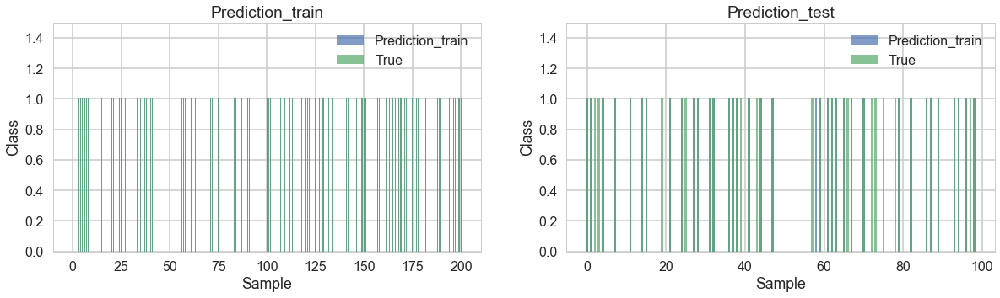

In [439]:
plt.figure(figsize=(20,5))
plt.subplot(121)
print ('Prediction accuracy rat using random forestregression for train set:',np.mean(Y_disease_train == predictions_rf_train))
n = np.arange(len(predictions_rf_train))
plt.bar(n,predictions_rf_train,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_train,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_train')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)

plt.subplot(122)
print ('Prediction accuracy rat using random forestregression for test set:',np.mean(Y_disease_test == predictions_rf_test))
n = np.arange(len(predictions_logistic_test))
plt.bar(n,predictions_logistic_test,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_test,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_test')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)
plt.show()


### Feature Importance
To determine the importance for each characteristics, measures the change in prediction accuracy if we take a given feature and permute (scramble) it across the datapoints in the training set.

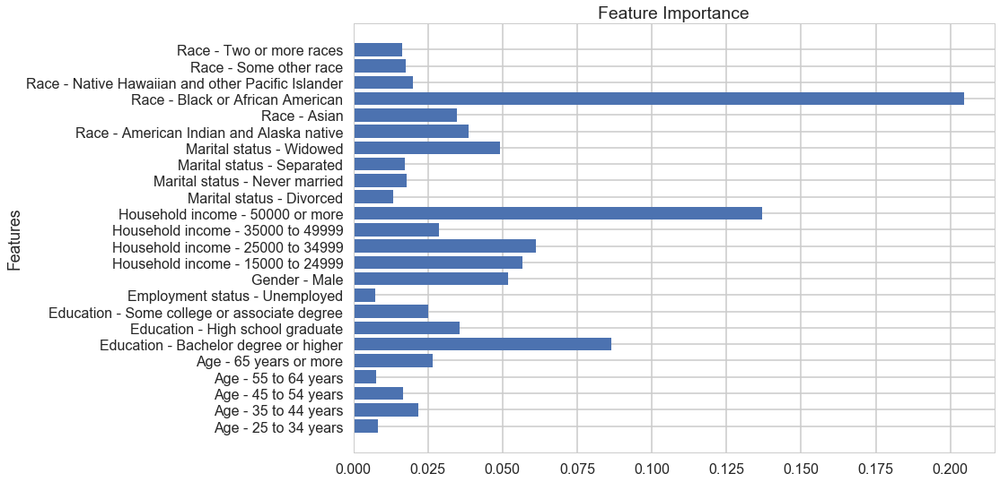

In [424]:

# display the relative importance of each attribute
relval = clf_rf.feature_importances_

# horizontal bar plot of feature importance
pos = np.arange(24) 
plt.barh(pos, relval, align='center')
plt.title("Feature Importance")
plt.xlabel("")
plt.ylabel("Features")
plt.yticks(pos, list(df_socio1)[8:])
plt.show()

As seen from the feature importance, the results are a little different from what we got from linear regression (lasso and ridge), as we found before, the congenital factors (race, age, gener) are the most important elements that affects the disease prevalence. Based on random forest, the results show that household income and education also contributes a lot to our prediction of disease prevalence. The main difference mainly results from our different setting of observation outcomes and out limited datasize.

## 3. Kmeans

Apart from supervised leanring, K-Means is a fast and simple unsupervised clustering algorithm that produces a hard clustering of the data, each data point is assigned a cluster. In the case, we assume that there exists two separate clusters: higher-level disease prevalence and lower-level disease prevalence. 

In [256]:
from sklearn.cluster import KMeans
from sklearn import preprocessing
Y_disease = df_socio1.values[:,7]
X_disease = df_socio1.values[:,8:32]
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
X_disease_train, X_disease_test, Y_disease_train, Y_disease_test = train_test_split(X_disease,
                                                    Y_disease, test_size=.33,
                                                    random_state=1230)

# demean
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_disease_train-np.mean(X_disease_train,axis = 0))
predict_train_kmeans = kmeans.predict(X_disease_train-np.mean(X_disease_train,axis = 0))
predict_test_kmeans = kmeans.predict(X_disease_test-np.mean(X_disease_test,axis = 0))
print ('Accuracy rate for train set:',np.mean(predict_train_kmeans==Y_disease_train))
print ('Accuracy rate for test set:',np.mean(predict_test_kmeans==Y_disease_test))

Accuracy rate for train set: 0.89552238806
Accuracy rate for test set: 0.868686868687


## 4. Gaussian Mixture
A natural generalization of K-means clustering is model-based clustering and it is based on Gaussian mixture models. That is to say, K-Means can also be interpreted to be a specific form of Gaussians mixture. To model our socio-demographic data as a mixture of two Gaussian components. We first apply EM(Expectation Maximization) algorithm initialized with K-Means estimates of component means and covariance, to compute the MLE of our model parameters.

Here are the steps:

* Repeat until convergence 
*  E-step: For each $i,j$ calculate $$ w_{i,j} = q_i(z_i=j)=p(z_i=j \vert  x_i, \lambda, \mu, \Sigma) $$
     
* M-step: We need to maximize, with respect to our parameters in the likelihood function
$$
\begin{eqnarray}
 \mathcal{L} &=& \sum_i \sum_{z_i} q_i(z_i) \log \frac{p(x_i,z_i  \vert \lambda, \mu, \Sigma)}{q_i(z_i)} \nonumber \\
 \mathcal{L} &=& \sum_i \sum_{j=i}^{k}  q_i(z_i=j) \log \frac{p(x_i \vert z_i=j , \mu, \Sigma) p(z_i=j \vert \lambda)}{q_i(z_i=j)} \\\
 \mathcal{L} & =&  \sum_{i=1}^{m} \sum_{j=i}^{k} w_{i,j}  \log \left[   \frac{ \frac{1}{ (2\pi)^{n/2} \vert \Sigma_j \vert ^{1/2}} \exp \left(    -\frac{1}{2}(x_i-\mu_j)^T \Sigma_j^{-1} (x_i-\mu_j) \right)  \, \lambda_j   }{w_{i,j}}\right]
\end{eqnarray}
$$

* Taking the derivatives yields the following updating formulas:<h5 align="center"> $$
\begin{eqnarray}
 \lambda_j &=& \frac{1}{m} \sum_{i=1}^m w_{i,j} \nonumber \\ 
 \mu_j&=& \frac{ \sum_{i=1}^m  w_{i,j} \, x_i}{ \sum_{i=1}^m  w_{i,j}} \nonumber \\ 
 \Sigma_j &=& \frac{ \sum_{i=1}^m  w_{i,j} \, (x_i-\mu_j)(x_i-\mu_j)^T}{ \sum_{i=1}^m  w_{i,j}}
\end{eqnarray}
$$

To calculate the E-step we basically calculating the posterior of the  $z$'s given the $x$'s and the
current estimate of our parameters. We can use Bayes rule 

$$ w_{i,j}= p(z_i=j \vert  x_i, \lambda, \mu, \Sigma) = \frac{p( x_i \vert  z_i=j,  \mu, \Sigma)\, p(z_i=j \vert \lambda)}{\sum_{l=1}^k p(x_i  \vert  z_i=l,  \mu, \Sigma) \, p(z_i=l \vert \lambda)} $$


In [269]:

from scipy.stats.distributions import norm
from scipy.stats import multivariate_normal

def Estep(x, mu, sigma, lam):
    a = lam * multivariate_normal.pdf(x, mu[0], sigma[0])
    b = (1. - lam) * multivariate_normal.pdf(x, mu[1], sigma[1])
    return b / (a + b),np.sum(a)


def Mstep(x, w):
    lam = np.mean(1.-w) 
    #one_arr = np.ones(len(w))
    mu0 = np.zeros((1,24))
    mu1 = np.zeros((1,24))
   
    for i in range(len(x)):
        mu0 = mu0 + (1-w[i]) * x[i]
        mu1 = mu1 + (w[i]) * x[i]
    
    mu = np.zeros((2,24))
    mu[0,:] = mu0/np.sum(1-w)
    mu[1,:] = mu1/np.sum(w)
    sig0 = np.zeros((24,24))
    sig1 = np.zeros((24,24))
    for i in range(len(x)):
        sig0 = sig0 + (1-w[i]) * ((x[i] - mu[0]).reshape(24,1)) .dot ((x[i] - mu[0]).reshape(1,24)) 
        sig1 = sig1 + (w[i]) * ((x[i] - mu[1]).reshape(24,1)) .dot ((x[i] - mu[1]).reshape(1,24)) 
             
    sigma = np.array([sig0/np.sum(1-w),sig1/np.sum(w)])
    return mu, sigma, lam

In [270]:
sigma_0.shape

(24, 24)

Iterations 6
Train_accuracy rate with EM algorithm: 0.900497512438
Test_accuracy rate with EM algorithm: 0.868686868687


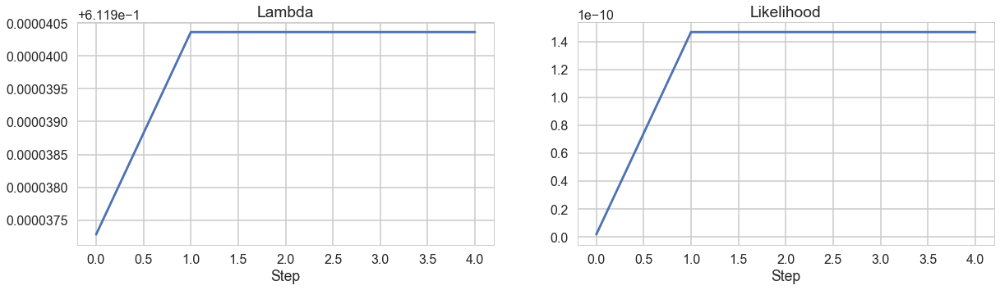

In [365]:
pred0_index = np.where(predict_train_kmeans == 0)[0]
pred1_index = np.where(predict_train_kmeans == 1)[0]

sigma_0 = np.cov(X_disease_train[pred0_index].T)
sigma_1 = np.cov(X_disease_train[pred1_index].T)


sigma = np.array([sigma_0,sigma_1])
mu = np.zeros((2,24))
mu[0,:] = np.mean(X_disease_train[pred0_index],axis=0)
mu[1,:] = np.mean(X_disease_train[pred1_index],axis=0)
lam = 0.01

mu_new_lis = []
sigma_new_lis = []
lam_new_lis = []
# Stopping criterion
crit = 1e-15

# Convergence flag
converged = False

# Loop until converged
iterations=1
likeli = []

while not converged:
        
    w,a = Estep(X_disease_train, mu, sigma, lam)
    likeli.append(a)
    # M-step
    mu_new, sigma_new, lam_new = Mstep(X_disease_train, w)
    
    # Check convergence
    converged = ((np.abs(lam_new - lam) < crit) 
                 & np.all(np.abs((np.array(mu_new) - np.array(mu)) < crit))
                 & np.all(np.abs((np.array(sigma_new) - np.array(sigma)) < crit)))
    mu, sigma, lam = mu_new, sigma_new, lam_new
    
    mu_new_lis.append(mu_new)
    sigma_new_lis.append(sigma_new)
    lam_new_lis.append(lam_new)
    iterations +=1   

plt.figure(figsize=(20,5))

plt.subplot(121)
print("Iterations", iterations)
w[w<0.5] = 0
w[w>=0.5] = 1
print ('Train_accuracy rate with EM algorithm:',np.mean(w == Y_disease_train))
predict_train_EM = np.mean(w == Y_disease_train)
w2,b = Estep(X_disease_test, mu, sigma, lam)
w2[w2>0.5] = 1
w2[w2<=0.5] = 0

print ('Test_accuracy rate with EM algorithm:',np.mean(w2 == Y_disease_test))
predict_test_EM = np.mean(w2 == Y_disease_test)

plt.subplot(121)

plt.plot(lam_new_lis)
plt.xlabel('Step')

plt.title('Lambda')

plt.subplot(122)
plt.plot(likeli)
plt.title('Likelihood')
plt.xlabel('Step')
plt.show()



## 5. Bayesian Model
Overfitting is a primary concern with using MLE model parameters, this is particularly problemmatic for Gaussian Mixture Models. One solution is to compute MAP estimates. Consider the following Bayesian model for our mixture of Gaussians:
\begin{align}\\
\   x_{i} | z_{ik} = 1 &\sim \mathcal{N}(\mu_{k}, \Sigma_{k}), \quad i = 1, \ldots, N\\
\mu_{k} &\sim \mathcal{N}\left([5, 5, 5], \left(\begin{array}{ccc}
100 & 0 &0\\
0 & 100 & 0 \\
0 & 0 &100 \\
\end{array}\right)\right), \quad k = 0, 1\\
\Sigma_{k} &= \left(\begin{array}{ccc}s_{0k} & 0 &0\\
0 & s_{1k} & 0 \\
0 & 0 &s_{2k} \\
\end{array}\right), \quad k = 0, 1\\
s_{ik} &\sim U(0, 20), \quad i = 0, 1, 2;\quad k = 0, 1\\
z_{i} &\sim Cat(\pi)\\
\pi &\sim \mathcal{Dir}([100, 100])
\end{align}
where $x_i$ is the demographic characteristics of the $i$-th row of the dataset; $z_{i}$ is the (latent) vector indicating to which component $x_i$ belongs; $(\mu_k, \Sigma_k)$ are the parameters of the $k$-th Gaussian component; $\pi$ is the proportions of the two components in our mixture. 

Dirichlet_distribution is a multivariate generalization of the beta distribution. It very often used as prior distributions in Bayesian statistics, and in fact the Dirichlet distribution is the conjugate prior of the categorical distribution and multinomial distribution.


In [329]:
from pymc3.math import logsumexp

# Log likelihood of normal distribution
def logp_normal(mu, tau, value):
    # log probability of individual samples
    k = tau.shape[0]
    delta = lambda mu: value - mu
    return (-1 / 2.) * (k * tt.log(2 * np.pi) + tt.log(1./det(tau)) +
                         (delta(mu).dot(tau) * delta(mu)).sum(axis=1))

# Log likelihood of Gaussian mixture distribution
def logp_gmix(mus, pi, tau):
    def logp_(value):        
        logps = [tt.log(pi[i]) + logp_normal(mus[i], tau[i], value)
                 for i in range(2)]
            
        return tt.sum(logsumexp(tt.stacklists(logps)[:, :X_disease_train.shape[0]], axis=0))

    return logp_



In [358]:
import pymc3 as pm
from pymc3 import Normal, Metropolis, sample, MvNormal, Dirichlet, \
    DensityDist, find_MAP, NUTS, Slice
import theano.tensor as tt
from theano.tensor.nlinalg import det
with pm.Model() as model:
    pi = Dirichlet('pi', a= 100 * np.ones(2), shape=(2,))
    mus = [MvNormal('mu_%d' % i, mu= 0 * np.ones(24), cov= 100 * np.eye(24), shape=(24,)) for i in range(2)]

    sds0 = pm.Uniform('sds0', lower=0, upper=30, shape= (24,))
    sds1 = pm.Uniform('sds1', lower=0, upper=30, shape= (24,))
    
    
    tau0 = tt.nlinalg.matrix_inverse(pm.Deterministic('cov_0', tt.nlinalg.diag(sds0)))
    tau1 = tt.nlinalg.matrix_inverse(pm.Deterministic('cov_1', tt.nlinalg.diag(sds1)))

    
    taus = [tau0,tau1]
    
    xs = DensityDist('xs', logp_gmix(mus, pi, taus), observed = X_disease_train)


In [359]:
with model:
    start = find_MAP()
    step = Metropolis()
    trace = sample(100000, step, start=start)



100%|██████████| 100000/100000 [07:08<00:00, 233.43it/s]

         Current function value: 10625.309058
         Iterations: 227
         Function evaluations: 253
         Gradient evaluations: 252


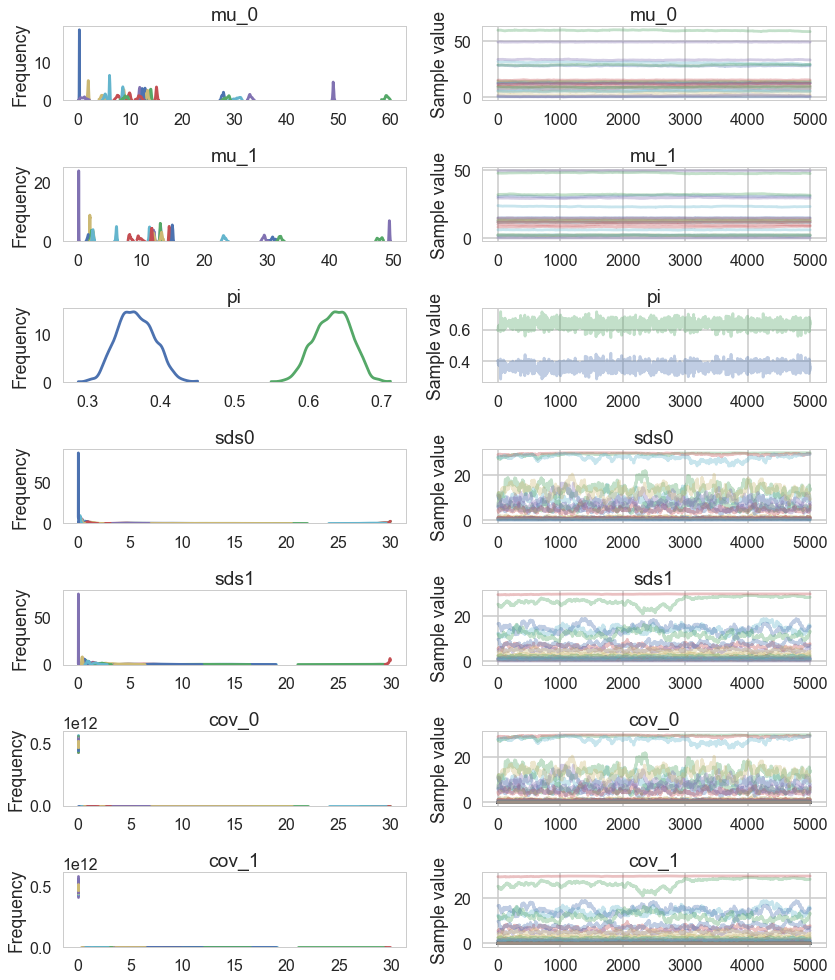

In [360]:
full_trace = trace[-5000:]
pm.traceplot(full_trace)
plt.show()

In [478]:
cov_0_mean = np.mean(full_trace['cov_0'],axis = 0)
cov_1_mean = np.mean(full_trace['cov_1'],axis = 0)

mu_0_mean = np.mean(full_trace['mu_0'],axis = 0)
mu_1_mean = np.mean(full_trace['mu_1'],axis = 0)

mus1 = [mu_0_mean,mu_1_mean]
tau1 = [cov_0_mean,cov_1_mean]

pi = np.mean(full_trace['pi'],axis = 0)

from scipy.stats import multivariate_normal
y_pdf0 = pi[0] * multivariate_normal.pdf(X_disease_train, mean= mu_0_mean, cov=cov_0_mean)
y_pdf1 = pi[1] * multivariate_normal.pdf(X_disease_train, mean= mu_1_mean, cov=cov_1_mean)
prediction = np.zeros(len(X_disease_train))
for i in range(len(X_disease_train)):
    if y_pdf0[i] > y_pdf1[i]:
        prediction[i] = 0
    else:
        prediction[i] = 1
print ('Prediction accuracy for train set:',np.mean(Y_disease_train == prediction))
prediction_train_Mix = np.mean(Y_disease_train == prediction)

from scipy.stats import multivariate_normal
y_pdf0 = pi[0] * multivariate_normal.pdf(X_disease_test, mean= mu_0_mean, cov=cov_0_mean)
y_pdf1 = pi[1] * multivariate_normal.pdf(X_disease_test, mean= mu_1_mean, cov=cov_1_mean)
prediction = np.zeros(len(X_disease_test))
for i in range(len(X_disease_test)):
    if y_pdf0[i] > y_pdf1[i]:
        prediction[i] = 0
    else:
        prediction[i] = 1


true_classification_test = np.zeros(len(X_disease_test))
print ('Prediction accuracy for test set:',np.mean(Y_disease_test == prediction))

prediction_test_Mix = np.mean(Y_disease_test == prediction)


Prediction accuracy for train set: 0.621890547264
Prediction accuracy for test set: 0.585858585859


### Summary for Method 2-4 (Binary Observation Outcomes)

In [468]:
predictions_logistic_train_rate = np.mean(Y_disease_train == predictions_logistic_train)
predictions_logistic_test_rate = np.mean(Y_disease_test == predictions_logistic_test)

predictions_rf_train_rate = np.mean(Y_disease_train == predictions_rf_train)
predictions_rf_test_rate = np.mean(Y_disease_test == predictions_rf_test)

predictions_k_train_rate = np.mean(Y_disease_train == predict_train_kmeans)
predictions_k_test_rate = np.mean(Y_disease_test == predict_test_kmeans)

predict_train_EM_rate = np.mean(Y_disease_train == predict_train_EM)
predict_test_EM_rate = np.mean(Y_disease_test == predict_test_EM)

In [479]:
prediction_test_Mix
compare_arr = np.array([predictions_logistic_train_rate,predictions_rf_train_rate,predictions_k_train_rate,\
                        predict_train_EM,prediction_train_Mix,predictions_logistic_test_rate,predictions_rf_test_rate,predictions_k_test_rate,predict_test_EM,prediction_test_Mix]).reshape(2,5)
names = ['Logistic','Random Forest','Kmeans','EM','Gaussian Mixture']
df_compare = pd.DataFrame(data=compare_arr, columns=names,index = ['Train Accuracy Rate','Test Accuracy Rate'])
df_compare

,Logistic,Random Forest,Kmeans,EM,Gaussian Mixture
Train Accuracy Rate,0.940299,1.000000,0.895522,0.900498,0.621891
Test Accuracy Rate,0.858586,0.888889,0.868687,0.868687,0.585859


As seen from the table, random forest and logistic regression has the better performance than the other three in prediction accuracy rate. 

## 6. Multinomial Logistic Regression

As mentioned before, we divided our observations into 2 groups. In order to get a more diverse range of scales based on percentiles, we can ressign our observation into more groups and look at the performance.

$$P(Y=i|x,W,b) = softmax(Wx+b)=\frac { { e }^{ { W }_{ i }x+{ b }_{ i } } }{ \sum _{ j }^{ k }{ { e }^{ { W }_{ j }x+{ b }_{ j } } }  } $$

In [436]:
df_socio['disease_mean']

,state,year,Diabetes,Heart attack,Angina or coronary,Obese,Stroke,disease_mean,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races,text
0,AL,2007,10.3,4.9,5.2,30.9,3.6,10.98,12.7,13.7,14.4,11.4,13.5,19.494115,32.204432,28.466480,6.7,48.365753,13.6,11.9,14.9,41.3,11.8,27.1,2.4,7.5,0.447076,0.962888,26.191811,0.032801,0.749570,1.300128,AK
1,AK,2007,6.1,2.3,2.5,28.2,1.9,8.20,13.9,14.2,16.1,10.7,6.9,22.729358,32.075809,34.604619,8.8,52.273811,7.9,8.0,12.6,62.6,11.5,32.5,2.0,3.3,13.469051,4.818882,3.777883,0.728334,2.272348,6.864888,AL
2,AZ,2007,8.4,4.6,4.9,25.8,2.9,9.32,14.5,13.6,12.9,10.3,12.9,22.914359,27.624823,32.112133,5.8,50.061755,11.0,11.8,15.5,49.8,12.4,30.6,1.9,5.9,4.434562,2.388703,3.549451,0.121491,10.683297,2.435415,AR
3,AR,2007,9.2,5.1,5.5,29.3,3.1,10.44,12.9,13.4,14.0,11.3,14.0,17.707376,35.750906,27.739906,7.2,48.935956,14.3,13.0,16.1,37.7,11.8,24.6,2.4,7.6,0.614682,1.197017,15.601787,0.080217,2.252578,1.702838,AZ
4,CA,2007,7.6,3.1,3.0,23.3,2.3,7.86,14.3,14.9,14.0,9.7,10.9,26.477150,24.526672,29.436311,6.6,50.014063,9.7,9.3,13.0,57.5,9.5,34.6,2.5,5.3,0.727846,12.342025,6.191967,0.345647,16.679592,3.453557,CA


In [492]:
perce = np.arange(0,100,40)
thre = []
for i in range(len(perce)):
    thre.append(np.percentile(df_socio['disease_mean'],perce[i]))

In [496]:
obser = np.zeros(len(df_socio['disease_mean']))
for i in range(len(df_socio['disease_mean'])):
    if df_socio['disease_mean'].values[i]<thre[0]:
        obser[i] = 0
    elif df_socio['disease_mean'].values[i] > thre[0] and df_socio['disease_mean'].values[i] < thre[1]:
        obser[i] = 1
    elif df_socio['disease_mean'].values[i] > thre[1] and df_socio['disease_mean'].values[i] < thre[2]:
        obser[i] = 2
    else:
        obser[i] = 3
            
            

In [500]:
X_disease_train, X_disease_test, Y_disease_train, Y_disease_test = train_test_split(X_disease,
                                                    obser, test_size=.33,
                                                    random_state=1230)


from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

clf_multi_logistic = linear_model.LogisticRegression(max_iter=10000)
# fit and predict
clf_multi_logistic.fit(X_disease_train,Y_disease_train )


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=10000, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [501]:
predictions_multi_logistic_train = clf_multi_logistic.predict(X_disease_train)
scores = cross_val_score(LogisticRegression(), X_disease_train, Y_disease_train, cv= 5, scoring='accuracy')
scores

array([ 0.73809524,  0.625     ,  0.75      ,  0.75      ,  0.84615385])

Prediction accuracy rat using multinomial logistic regression for train set: 0.825870646766
Prediction accuracy rat using logistic regression for test set: 0.757575757576


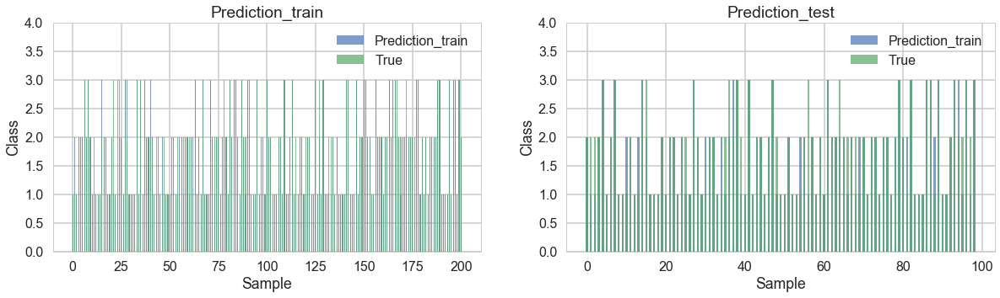

In [504]:

plt.figure(figsize=(20,5))
plt.subplot(121)
print ('Prediction accuracy rat using multinomial logistic regression for train set:',np.mean(Y_disease_train == predictions_multi_logistic_train))
n = np.arange(len(predictions_multi_logistic_train))
plt.bar(n,predictions_multi_logistic_train,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_train,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_train')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,4)
plt.legend(loc=1)

plt.subplot(122)
predictions_multi_logistic_test = clf_multi_logistic.predict(X_disease_test)
print ('Prediction accuracy rat using logistic regression for test set:',np.mean(Y_disease_test == predictions_multi_logistic_test))
n = np.arange(len(predictions_multi_logistic_test))
plt.bar(n,predictions_multi_logistic_test,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_disease_test,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_test')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,4)
plt.legend(loc=1)
plt.show()
plt.show()

Compared with binomial logistic regression, the prediction accuracy in train and test set is lower for multinomial logistic regression. That makes sense since the outcome is too diverse to predict correctly. Classifying the outcome into two clusters seems to be a good choice in this case.

## Part II - Analysis on  Hospitals Quality Based on Socio-Demographic Characteristics 
A hospital summary score is calculated by taking the weighted average of the hospital’s scores for each measure group of total seven categories, including mortality, safety, readmission, patient experience, effectiveness of care, timeliness of care and efficient use of medical imaging. We now replace the orginal disease prevelence outcomes with thw hospital summary score for the following predictions.


<font color = "blue">

## Please run this cell to show the animation map

In [10]:
hospital_data=pd.read_csv("HospInfo.csv")
hospital_data.head(2)
#print(data_df.
#Read in dataset and remove unnecessary data
df=pd.read_csv('HospInfo.csv')
init_notebook_mode(connected=True)
df_ratings=df.drop(['Address','ZIP Code','Phone Number','Emergency Services',
'Patient experience national comparison footnote','Efficient use of medical imaging national comparison footnote',
'Hospital overall rating footnote','Mortality national comparison footnote','Mortality national comparison footnote',
'Safety of care national comparison footnote','Readmission national comparison footnote',
'Patient experience national comparison footnote','Effectiveness of care national comparison footnote',
'Timeliness of care national comparison footnote','Timeliness of care national comparison footnote',
'Efficient use of medical imaging national comparison footnote','Meets criteria for meaningful use of EHRs',
'Provider ID'],axis=1)
#Converting verbal rankings into integers so we can measure.
df1=df_ratings.replace('Below the National average', 1)
df2=df1.replace('Same as the National average', 2)
df3=df2.replace('Above the National average', 3)
    
#Converting data types to numeric
df3['Mortality national comparison'] = df3['Mortality national comparison'].convert_objects(convert_numeric=True)
df3['Safety of care national comparison'] = df3['Safety of care national comparison'].convert_objects(convert_numeric=True)
df3['Readmission national comparison'] = df3['Readmission national comparison'].convert_objects(convert_numeric=True)
df3['Patient experience national comparison'] = df3['Patient experience national comparison'].convert_objects(convert_numeric=True)
df3['Mortality national comparison'] = df3['Mortality national comparison'].convert_objects(convert_numeric=True)
df3['Hospital overall rating'] = df3['Hospital overall rating'].convert_objects(convert_numeric=True)
#Prepping our dataframe for the map
df4=df3.groupby('State')['Hospital overall rating'].mean()
df4=pd.DataFrame(df4)
df4=df4.reset_index()

#Map syntax
df['text'] = df4['State']

data = [dict(
    type='choropleth',
    autocolorscale = False,
    locations = df4['State'],
    z = df4['Hospital overall rating'].astype(float),
    locationmode = 'USA-states',
    text = df['text'],
    hoverinfo = 'location+z',
    marker = dict(
        line = dict (
            color = 'rgb(255,255,255)',
            width = 2
        )
    ),
    colorbar = dict(
        title = "Rating"
    )
)]
layout = dict(
    title = 'Hospital Ratings by State',
    geo = dict(
        scope='usa',
        projection=dict( type='albers usa' ),
        showlakes = True,
        lakecolor = 'rgb(255,255,255)'
    )
)    
fig = dict(data=data, layout=layout)

import plotly.graph_objs as go

iplot(fig, validate=False, filename='d3-Ratings-map')
hospital_data['Hospital overall rating'].unique()
clean_hospital_data=hospital_data.drop(hospital_data[hospital_data['Hospital overall rating']=='Not Available'].index)
#clean_hospital_data['Hospital overall rating'].astype(float)
clean_hospital_data['Hospital overall rating'].unique()
clean_hospital_data['Hospital overall rating']=clean_hospital_data['Hospital overall rating'].astype(float)
Statewise_avarage_rating=clean_hospital_data.groupby('State')['Hospital overall rating'].sum()
index=Statewise_avarage_rating.sort_values(ascending=False).index
values=Statewise_avarage_rating.sort_values(ascending=False).values



In [530]:
hospital_data.head(3)

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Hospital Type,Hospital Ownership,Emergency Services,Meets criteria for meaningful use of EHRs,Hospital overall rating,Hospital overall rating footnote,Mortality national comparison,Mortality national comparison footnote,Safety of care national comparison,Safety of care national comparison footnote,Readmission national comparison,Readmission national comparison footnote,Patient experience national comparison,Patient experience national comparison footnote,Effectiveness of care national comparison,Effectiveness of care national comparison footnote,Timeliness of care national comparison,Timeliness of care national comparison footnote,Efficient use of medical imaging national comparison,Efficient use of medical imaging national comparison footnote,Location
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,3347938701,Acute Care Hospitals,Government - Hospital District or Authority,True,True,3,NaN,Same as the National average,NaN,Above the National average,NaN,Same as the National average,NaN,Below the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,NaN
1,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,MARSHALL,2565938310,Acute Care Hospitals,Government - Hospital District or Authority,True,True,3,NaN,Below the National average,NaN,Same as the National average,NaN,Above the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,Above the National average,NaN,Below the National average,NaN,NaN
2,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,LAUDERDALE,2567688400,Acute Care Hospitals,Government - Hospital District or Authority,True,True,2,NaN,Below the National average,NaN,Same as the National average,NaN,Same as the National average,NaN,Below the National average,NaN,Same as the National average,NaN,Above the National average,NaN,Same as the National average,NaN,NaN


In [526]:
Statewise_avarage_rating
rating = np.zeros(50)
for i in range(len(df_socio['state'].values[:50])):
    for j in range(len(Statewise_avarage_rating)):
        if df_socio['state'][i] == Statewise_avarage_rating.keys()[j]:
            rating[i] = Statewise_avarage_rating[j]

In [537]:
hospital_rating_mean = np.mean(rating)
rating_binary = np.zeros(50)
for i in range(len(rating)):
    if rating[i] <= hospital_rating_mean:
        rating_binary[i] = 0
    else:
        rating_binary[i] = 1

In [543]:
X_hospital_train, X_hospital_test, Y_hospital_train, Y_hospital_test = train_test_split(X_disease[:50],
                                                    rating_binary, test_size=.33,
                                                    random_state=1234)

### Binomial Logistic Regression:

In [544]:
clf_hospital_logistic = linear_model.LogisticRegression(max_iter=10000)
# fit and predict
clf_hospital_logistic.fit(X_hospital_train,list(Y_hospital_train) )
predictions_hospital_logistic_train = clf_hospital_logistic.predict(X_hospital_train)
scores = cross_val_score(LogisticRegression(), X_hospital_train, list(Y_hospital_train), cv= 5, scoring='accuracy')
scores

array([ 0.5       ,  0.57142857,  0.66666667,  0.66666667,  0.66666667])

Prediction accuracy rat using logistic regression for train set: 0.848484848485
Prediction accuracy rat using logistic regression for test set: 0.705882352941


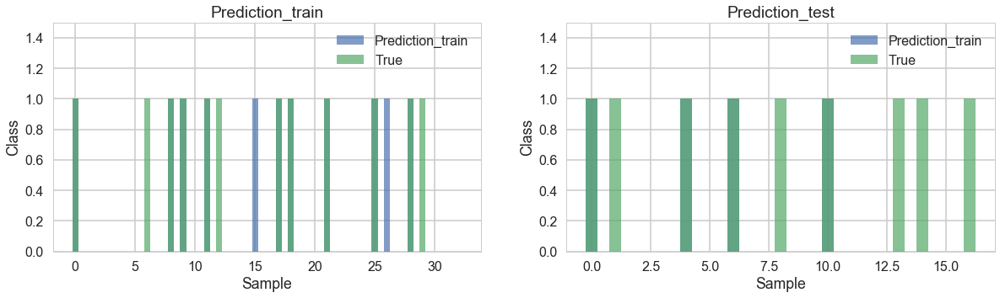

In [550]:

plt.figure(figsize=(20,5))
plt.subplot(121)
print ('Prediction accuracy rat using logistic regression for train set:',np.mean(Y_hospital_train == predictions_hospital_logistic_train))
n = np.arange(len(predictions_hospital_logistic_train))
plt.bar(n,predictions_hospital_logistic_train,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_hospital_train,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_train')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)

plt.subplot(122)
predictions_hospital_logistic_test = clf_logistic.predict(X_hospital_test)
print ('Prediction accuracy rat using logistic regression for test set:',np.mean(Y_hospital_test == predictions_hospital_logistic_test))
n = np.arange(len(predictions_hospital_logistic_test))
plt.bar(n,predictions_hospital_logistic_test,width = 0.5,alpha = 0.7,label = 'Prediction_train')
plt.bar(n,Y_hospital_test,width = 0.5,alpha = 0.7,label = 'True')
plt.title('Prediction_test')
plt.xlabel('Sample')
plt.ylabel('Class') 
plt.ylim(0,1.5)
plt.legend(loc=1)
plt.show()


In [552]:
connect = clf_hospital_logistic.coef_
df_coef2 = pd.DataFrame(data=connect, columns=list(df_socio)[8:32])
df_coef2

,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races
0,0.47389,0.751558,0.641818,-1.160359,-0.326445,0.106698,0.434294,-0.208788,-0.017866,-0.523158,0.097843,0.201425,0.321387,-0.042268,-0.002904,-0.029732,-0.226126,-0.118959,-0.170313,-0.227562,0.066817,-0.190149,0.159382,0.533876


As shown in the coefficient table, age, education, gender,household and race distribution all contribute a lot to local hospital quality. For example, the more the number of people who are between 25 and 54 years old, the higher the quality of hospital quality level in that state. In terms of race (Race - Two or more races = 0.53), the more diverse the range of races, the higher the quality of hospital quality level in that state.

## Small Data Size Troubleshooting - GANs (Generative Adversarial Networks)
Generative adversarial networks (GANs) are a type of artificial intelligence algorithms used in unsupervised machine learning to approximate an intractable cost function. For our dataset, the big issue is that the data size is too small which may not be very represnetative. In order to generate more 'real' data, we could apply GANs to help us expand our data.

Here is the basic theory: two models fighting against each other would be able to co-train through plain old backpropagation. Given some real data set R, G is the generator, trying to create fake data that looks just like the genuine data, while D is the discriminator, getting data from either the real set or G and labeling the difference. G was like a team of forgers trying to match real paintings with their output, while D was the team of detectives trying to tell the difference.In the ideal case, both D and G would get better over time until G had essentially become a “master forger” of the genuine article and D was at a loss, “unable to differentiate between the two distributions.”

In [528]:
df_socio1.head()

,state,year,Diabetes,Heart attack,Angina or coronary,Obese,Stroke,disease_mean,Age - 25 to 34 years,Age - 35 to 44 years,Age - 45 to 54 years,Age - 55 to 64 years,Age - 65 years or more,Education - Bachelor degree or higher,Education - High school graduate,Education - Some college or associate degree,Employment status - Unemployed,Gender - Male,Household income - 15000 to 24999,Household income - 25000 to 34999,Household income - 35000 to 49999,Household income - 50000 or more,Marital status - Divorced,Marital status - Never married,Marital status - Separated,Marital status - Widowed,Race - American Indian and Alaska native,Race - Asian,Race - Black or African American,Race - Native Hawaiian and other Pacific Islander,Race - Some other race,Race - Two or more races
0,AL,2007,10.3,4.9,5.2,30.9,3.6,1.0,12.7,13.7,14.4,11.4,13.5,19.494115,32.204432,28.466480,6.7,48.365753,13.6,11.9,14.9,41.3,11.8,27.1,2.4,7.5,0.447076,0.962888,26.191811,0.032801,0.749570,1.300128
1,AK,2007,6.1,2.3,2.5,28.2,1.9,0.0,13.9,14.2,16.1,10.7,6.9,22.729358,32.075809,34.604619,8.8,52.273811,7.9,8.0,12.6,62.6,11.5,32.5,2.0,3.3,13.469051,4.818882,3.777883,0.728334,2.272348,6.864888
2,AZ,2007,8.4,4.6,4.9,25.8,2.9,0.0,14.5,13.6,12.9,10.3,12.9,22.914359,27.624823,32.112133,5.8,50.061755,11.0,11.8,15.5,49.8,12.4,30.6,1.9,5.9,4.434562,2.388703,3.549451,0.121491,10.683297,2.435415
3,AR,2007,9.2,5.1,5.5,29.3,3.1,1.0,12.9,13.4,14.0,11.3,14.0,17.707376,35.750906,27.739906,7.2,48.935956,14.3,13.0,16.1,37.7,11.8,24.6,2.4,7.6,0.614682,1.197017,15.601787,0.080217,2.252578,1.702838
4,CA,2007,7.6,3.1,3.0,23.3,2.3,0.0,14.3,14.9,14.0,9.7,10.9,26.477150,24.526672,29.436311,6.6,50.014063,9.7,9.3,13.0,57.5,9.5,34.6,2.5,5.3,0.727846,12.342025,6.191967,0.345647,16.679592,3.453557


In [531]:
df_socio1.to_csv('out.csv', sep=',')
X_mb = df_socio1.values[:,8:32]


To simplify our computation of GANs, the socio-demographic dataset is reduced into several main features, such as gender, age, household income and race.

In [556]:
data3_arr = np.zeros((300,4))
data3_arr[:,0] = df_socio1['Gender - Male']
data3_arr[:,1] = df_socio1['Age - 55 to 64 years']
data3_arr[:,2] = df_socio1['Household income - 35000 to 49999']
data3_arr[:,3] = df_socio1['Race - Native Hawaiian and other Pacific Islander']

Y = df_socio1['disease_mean']

In [615]:

filename_queue = tf.train.string_input_producer(["out.csv"])

reader = tf.TextLineReader()
key, value = reader.read(filename_queue)


def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)

feature = 4

X = tf.placeholder(tf.float32, shape=[None, feature])

D_W1 = tf.Variable(xavier_init([feature, 128]))
D_b1 = tf.Variable(tf.zeros(shape=[128]))

D_W2 = tf.Variable(xavier_init([128, 1]))
D_b2 = tf.Variable(tf.zeros(shape=[1]))

theta_D = [D_W1, D_W2, D_b1, D_b2]


Z = tf.placeholder(tf.float32, shape=[None, 16])
c = tf.placeholder(tf.float32, shape=[None, 5])

G_W1 = tf.Variable(xavier_init([21, 256]))
G_b1 = tf.Variable(tf.zeros(shape=[256]))

G_W2 = tf.Variable(xavier_init([256, feature]))
G_b2 = tf.Variable(tf.zeros(shape=[feature]))

theta_G = [G_W1, G_W2, G_b1, G_b2]


Q_W1 = tf.Variable(xavier_init([4, 128]))
Q_b1 = tf.Variable(tf.zeros(shape=[128]))

Q_W2 = tf.Variable(xavier_init([128, 5]))
Q_b2 = tf.Variable(tf.zeros(shape=[5]))

theta_Q = [Q_W1, Q_W2, Q_b1, Q_b2]


def sample_Z(m, n):
    return np.random.uniform(-1., 1., size=[m, n])


def sample_c(m):
    return np.random.multinomial(1, 5*[0.1], size=m)


def generator(z, c):
    inputs = tf.concat(axis=1, values=[z, c])
    G_h1 = tf.nn.relu(tf.matmul(inputs, G_W1) + G_b1)
    G_log_prob = tf.matmul(G_h1, G_W2) + G_b2
    G_prob = tf.nn.sigmoid(G_log_prob)

    return G_prob


def discriminator(x):
    D_h1 = tf.nn.relu(tf.matmul(x, D_W1) + D_b1)
    D_logit = tf.matmul(D_h1, D_W2) + D_b2
    D_prob = tf.nn.sigmoid(D_logit)

    return D_prob


def Q(x):
    Q_h1 = tf.nn.relu(tf.matmul(x, Q_W1) + Q_b1)
    Q_prob = tf.nn.softmax(tf.matmul(Q_h1, Q_W2) + Q_b2)

    return Q_prob




G_sample = generator(Z, c)
D_real = discriminator(X)
D_fake = discriminator(G_sample)
Q_c_given_x = Q(G_sample)

D_loss = -tf.reduce_mean(tf.log(D_real + 1e-8) + tf.log(1 - D_fake + 1e-8))
G_loss = -tf.reduce_mean(tf.log(D_fake + 1e-8))

cross_ent = tf.reduce_mean(-tf.reduce_sum(tf.log(Q_c_given_x + 1e-8) * c, 1))
ent = tf.reduce_mean(-tf.reduce_sum(tf.log(c + 1e-8) * c, 1))
Q_loss = cross_ent + ent

D_solver = tf.train.AdamOptimizer().minimize(D_loss, var_list=theta_D)
G_solver = tf.train.AdamOptimizer().minimize(G_loss, var_list=theta_G)
Q_solver = tf.train.AdamOptimizer().minimize(Q_loss, var_list=theta_G + theta_Q)

mb_size = 300
Z_dim = 16

#mnist = input_data.read_data_sets('../../MNIST_data', one_hot=True)

sess = tf.Session()
sess.run(tf.global_variables_initializer())
#coord = tf.train.Coordinator()
#threads = tf.train.start_queue_runners(coord=coord)



if not os.path.exists('out/'):
    os.makedirs('out/')

sam = []
i = 0
X_mb = data3_arr
D = []
G = []
for it in range(300):
    if it % 10 == 0:
        Z_noise = sample_Z(16, Z_dim)

        idx = np.random.randint(0, 5)
        c_noise = np.zeros([16, 5])
        c_noise[range(16), idx] = 1

        samples = sess.run(G_sample,
                           feed_dict={Z: Z_noise, c: c_noise})

        print ("This is generated sample: ", samples)
        sam.append(samples)
    Z_noise = sample_Z(mb_size, Z_dim)
    c_noise = sample_c(mb_size)

    _, D_loss_curr = sess.run([D_solver, D_loss],
                              feed_dict={X: X_mb, Z: Z_noise, c: c_noise})
    #print ('w')
    _, G_loss_curr = sess.run([G_solver, G_loss],
                              feed_dict={Z: Z_noise, c: c_noise})

    sess.run([Q_solver], feed_dict={Z: Z_noise, c: c_noise})
    
    D.append(D_loss_curr)
    G.append(G_loss_curr)
    if it % 5 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'.format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print('Class distribution',Q_c_given_x)
        print()


This is generated sample:  [[ 0.63399106  0.63030565  0.69273704  0.35114476]
 [ 0.63095999  0.37413996  0.53822768  0.34411594]
 [ 0.58361089  0.72106242  0.47216368  0.45160392]
 [ 0.50368917  0.5584085   0.60974765  0.35161421]
 [ 0.62265116  0.49573302  0.50330395  0.52168465]
 [ 0.64215058  0.37077129  0.52421319  0.27644774]
 [ 0.65170342  0.58673149  0.4646762   0.54304647]
 [ 0.48766389  0.62473637  0.49691799  0.39621386]
 [ 0.68457466  0.41185352  0.63194156  0.42717865]
 [ 0.58159441  0.42297629  0.54335111  0.47979659]
 [ 0.51153481  0.53493369  0.72433418  0.68067628]
 [ 0.59191513  0.39777267  0.6811285   0.30772543]
 [ 0.51424885  0.4875626   0.25653502  0.40138724]
 [ 0.58719289  0.46702284  0.59482974  0.37698972]
 [ 0.62874633  0.58222353  0.55775201  0.44498605]
 [ 0.67956889  0.4321948   0.45102516  0.48420447]]
Iter: 0
D loss: 0.9382
G_loss: 0.6549
Class distribution Tensor("Softmax_16:0", shape=(?, 5), dtype=float32)

Iter: 5
D loss: 0.8211
G_loss: 0.6067
Class di

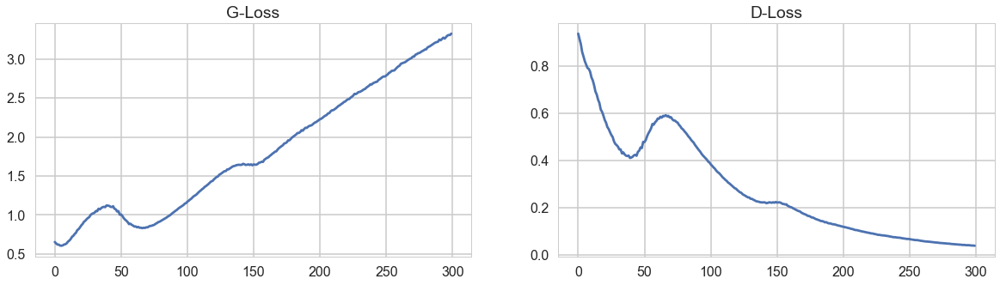

In [618]:
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.plot(G)
plt.title('G-Loss')
plt.subplot(122)
plt.plot(D)
plt.title('D-Loss')
plt.show()

As shown from the plots, they show that G-loss is diverging and D-loss is gradually close to zero, which means discriminator beats our generator after 300 iterations. In other words, our fake data does not succeed in the final. Since our base data is limited and it is hard to obtain the similar pattern, failure mode is a very normal phenomenon to occur using GANs

In [583]:
train_x_gans = np.concatenate((data3_arr, sam[-1],sam[-2],sam[-3]),axis=0)

In [589]:
Y = df_socio1['disease_mean']

### Kmeans

In [619]:


kmeans_gans = KMeans(n_clusters=2, random_state=0).fit(train_x_gans[50:])
predict_train_kmeans = kmeans_gans.predict(data3_arr[:50])
print ('Accuracy rate using generated fake data:',np.mean(predict_train_kmeans==Y[:50]))
kmeans_original = KMeans(n_clusters=2, random_state=0).fit(data3_arr[50:])
predict_train_kmeans_original = kmeans_original.predict(data3_arr[:50])
print ('Accuracy rate using actual data:',np.mean(predict_train_kmeans_original==Y[:50]))


Accuracy rate using generated fake data: 0.64
Accuracy rate using actual data: 0.62


As seen from the prediction accuracy, at the begainning without using GANs, the prediction performance is not very ideal (0.64). After applying GANs, the accuracy is not improved because of converge issue. 

## Conclusion and Further Improvement


### Conclusion 

In this project, we have analyzed the population health outcomes and local hospitals quality based on socio-demographic statistics. For the population health outcomes, it does have relationship with socio-demographic information,especailly congenital factor such as age,race and gender distribution. External factors like education, income and marital status does not contribute a lot in our health outcome estimate. On the other hand, hospital quality is determined by both external and congenital demographic characteristics, which validates that state-level health care and medical service are highly linked with local economy and education develpment apart from people's congenital health condition. 

Therefore, based on the findings of our research, using socio-demographic characteristics to model and accurately predict disease prevalence level implies that  population characteristics patterns in health and illness deserve to be investigate with more details, which can provide useful insights for understanding observed trends in population health and to inform future strategic decision making for improved health outcomes and local hospital quality levels.

### Further Improvement
1. The size of the socio-demographic data is quite small, it is necessary to find more update data to obtain more accurate estimate
2. Since the health outcomes contain serveral caregories of diseases such as diabetes, heart attack, angina or coronary, obese and stroke, which are not sufficient enough to represent population health outcomes. More detailed disease prevelence data should be collected
3. As we only consider the average prevelence level of all the diseases, for the further step, we hope to investigate each diseae prevelence with respect to our socio-demographic dataset in order to make our analysis more specific and persuasive.